# Logistic Regression

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from scipy.special import expit

In [2]:
X = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]).reshape(-1, 1)
y = np.array([0] * 5 + [1] * 5).reshape(-1, 1)

print(f"Shape of X: {X.shape}")
print(f"Shape of y: {y.shape}")

Shape of X: (10, 1)
Shape of y: (10, 1)


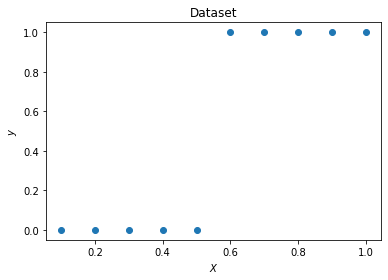

In [3]:
fig = plt.figure()
ax = plt.axes()
ax.set_title("Dataset")
ax.set_ylabel("$y$")
ax.set_xlabel("$X$")
ax.scatter(X, y)

In [4]:
class LogisticRegression():
  
  def __init__(self, save_weights=False):
    self._w = None
    self._save_weights = save_weights
    weights = [] if save_weights else None
    self._history = {"loss": [],
                     "weights": weights}

  def _soft_predict(self, X):
    # threshold trick
    X_tt = np.hstack((np.ones((len(X), 1)),X))
    return expit(X_tt @ self._w)
  
  def predict(self, X):
    prediction = self._soft_predict(X)
    return np.where(prediction < 0.5, 0, 1)

  def _mse(y, pred):
    return ((pred - y) ** 2).mean()
  
  def _cross_entropy(y, pred):
    return -(y * np.log(pred) + (1 - y) * np.log(1 - pred)).mean()

  def fit(self, X, y, learning_rate, epochs):
    # threshold trick
    X_tt = np.hstack((np.ones((len(y), 1)), X))
    
    if self._w is None:
      self._w = np.zeros((np.size(X_tt, 1), 1))

    for i in range(epochs):
      self._w = self._w - (learning_rate / len(y)) \
                            * X_tt.T @ (2 * (self._soft_predict(X) - y)) 
      self._history["loss"].append(LogisticRegression._cross_entropy(y, self._soft_predict(X)))
      if self._save_weights:
        self._history["weights"].append(self._w)
      
    return self._history

In [5]:
epochs = 500
learning_rate = 0.9

model = LogisticRegression(save_weights=True)

y_preds_soft = []
y_preds_hard = []
px = np.linspace(0, 1, 100).reshape(-1, 1)

for i in range(epochs):
  model.fit(X, y, learning_rate, 1)
  y_preds_soft.append(model._soft_predict(px))
  y_preds_hard.append(model.predict(px))
  
history = model._history

In [6]:
fig = plt.figure(figsize=(20, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
axs = [fig.add_subplot(1, 3, i) for i in [1,2,3]]

axs[0].set_ylim(min(history["loss"]), max(history["loss"]))
axs[0].set_xlim(0, epochs)
axs[0].set_title("Loss")
axs[0].set_xlabel("Epoch")
axs[0].set_ylabel("Loss value")

axs[1].set_ylim(np.min(model._w), np.max(model._w))
axs[1].set_xlim(-1, len(model._w))
axs[1].set_title("Bias and Weight Development")
axs[1].set_ylabel("Value")
axs[1].set_xticks(range(2))
axs[1].set_xticklabels(["Bias", "Weight"])

axs[2].scatter(X, y)
axs[2].set_title("Regression Line")
axs[2].set_xlabel("X")
axs[2].set_ylabel("Regression value")

loss = axs[0].plot([], [], 'r')[0]
soft_line = axs[2].plot([], [], 'g')[0]
hard_line = axs[2].plot([], [], 'r-')[0]
plt.close()

In [7]:
def animate(i):
  loss.set_data(range(i), history["loss"][:i])
  px = np.linspace(0, 1, 100).reshape(-1, 1)
  soft_line.set_data(px, y_preds_soft[i])
  hard_line.set_data(px, y_preds_hard[i])
  w = history["weights"][i][:, 0]
  axs[1].bar(range(len(w)), w, color="r")
  return (loss,)

In [8]:
anim = animation.FuncAnimation(fig, animate, frames=epochs,
                               interval=30, blit=True)

In [9]:
HTML(anim.to_jshtml(default_mode="once"))